In [1]:
%reload_ext nb_black

<IPython.core.display.Javascript object>

In [2]:
import pickle

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

%matplotlib inline

from tqdm.notebook import tqdm

from scipy import stats

from sklearn.cluster import DBSCAN, KMeans
from sklearn.metrics import confusion_matrix, classification_report, silhouette_score


from scipy.stats.mstats import winsorize

from sklearn.decomposition import PCA
import umap
from sklearn import metrics

from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import NearestNeighbors

from xgboost import XGBClassifier

from sklearn.preprocessing import StandardScaler, OneHotEncoder, MinMaxScaler
from category_encoders import LeaveOneOutEncoder

from sklearn.ensemble import RandomForestClassifier

import plotly.graph_objects as go
from plotly.subplots import make_subplots
from scipy import stats



<IPython.core.display.Javascript object>

In [3]:
# use this to know Statistically significant features per cluster.
def main_features(i):
    # for i in range(0, len(cluster_list) - 1):
    # Isolate cluster data
    cluster_list = list(set(clst.labels_))
    dfm["label"] = clst.labels_
    cluster = dfm[dfm["label"] == cluster_list[i]]
    other = dfm[dfm["label"] != cluster_list[i]]
    # Drop non numeric columns
    cluster = cluster.drop(columns=["label", "ticker"], errors="ignore")
    other = other.drop(columns=["label", "ticker"], errors="ignore")
    print(
        "Reviewing cluster number:",
        cluster_list[i],
        "\n",
        "\nFeatures that are statistically significant;\n",
    )
    for j in range(0, len(cluster.columns)):
        c = cluster[cluster.columns[j]]
        o = other[other.columns[j]]
        # Run Ttest
        t, p = stats.ttest_ind(a=c, b=o, equal_var=False)
        if p < 0.05:
            print(f"{cluster.columns[j]}")


# Discover Clusters with a simple function.
def fyi_cluster(cluster_num, feat):

    view_cluster = labeled_df[labeled_df["label"] == cluster_num]
    feat = feat

    print("These are the stock symbols for the cluster:")
    display(view_cluster["ticker"].unique())
    print("\n", "Each Ticker that has less than 19 has moved clusters from here:")
    display(view_cluster["ticker"].value_counts().head(10))
    print("\n", f"Top 5 and Bottom 5 by {feat}:")
    display(view_cluster.sort_values(by=feat, ascending=False).head().T)
    print("\n", f"Bottom 5 stocks by {feat} in cluster:")
    display(view_cluster.sort_values(by=feat, ascending=False).tail().T)

<IPython.core.display.Javascript object>

## Data Import, 

In [4]:
data = "data/fund.csv"
data_def = "data/SHARADAR_INDICATORS_a3407c5c2ec46991d2b7ac667785d0d1.csv"
fin_data = pd.read_csv(data)
df = fin_data.copy()
defs = pd.read_csv(data_def)

<IPython.core.display.Javascript object>

## Bring in Feature Name Key and Descriptions,

In [5]:
cols = list(df.columns)
# Create a df mapping definitions to df list.
defis = defs[["indicator", "title", "description"]]
defis = defis[defis.indicator.isin(cols)]
defis = defis.drop_duplicates()

defis.style.set_properties(subset=["description"], **{"width-min": "300px"})

,indicator,title,description
0,revenue,Revenues,[Income Statement] Amount of Revenue recognized from goods sold; services rendered; insurance premiums; or other activities that constitute an earning process. Interest income for financial institutions is reported net of interest expense and provision for credit losses.
12,netinccmn,Net Income Common Stock,[Income Statement] The amount of net income (loss) for the period due to common shareholders. Typically differs from [NetInc] to the parent entity due to the deduction of [PrefDivIS].
15,shareswa,Weighted Average Shares,[Income Statement] The weighted average number of shares or units issued and outstanding that are used by the company to calculate [EPS]; determined based on the timing of issuance of shares or units in the period.
25,ncfo,Net Cash Flow from Operations,[Cash Flow Statement] A component of [NCF] representing the amount of cash inflow (outflow) from operating activities; from continuing and discontinued operations.
30,assets,Total Assets,[Balance Sheet] Sum of the carrying amounts as of the balance sheet date of all assets that are recognized. Major components are [CashnEq]; [Investments];[Intangibles]; [PPNENet];[TaxAssets] and [Receivables].
31,cashneq,Cash and Equivalents,[Balance Sheet] A component of [Assets] representing the amount of currency on hand as well as demand deposits with banks or financial institutions.
33,investmentsc,Investments Current,[Balance Sheet] The current portion of [Investments]; reported if the company operates a classified balance sheet that segments current and non-current assets.
40,receivables,Trade and Non-Trade Receivables,[Balance Sheet] A component of [Assets] representing trade and non-trade receivables.
44,equity,Shareholders Equity,[Balance Sheet] A principal component of the balance sheet; in addition to [Liabilities] and [Assets]; that represents the total of all stockholders' equity (deficit) items; net of receivables from officers; directors; owners; and affiliates of the entity which are attributable to the parent.
47,assetsc,Current Assets,[Balance Sheet] The current portion of [Assets]; reported if a company operates a classified balance sheet that segments current and non-current assets.


<IPython.core.display.Javascript object>

### Initial look at df,
    - drop Q4 2020 data as most companies have not reported yet. 

In [6]:
# df.info()
df.head()

,ticker,revenue,pb,debt,assets,netmargin,ncfo,shareswa,sps,opinc,...,calendardate,datekey,sharesbas,equity,receivables,investmentsc,cashneq,assetsavg,netinccmn,fcfps
0,ZYME,2643000.0,4.916,7851000.0,571719000.0,-27.454,-16057000.0,50903633.0,0.052,-73694000.0,...,2020-09-30,2020-09-30,45627264.0,432354000.0,3692000.0,227737000.0,244120000.0,545838750.0,-214903000.0,-2.854
1,ZYME,12359000.0,3.344,8486000.0,606853000.0,-3.152,-49956000.0,50788681.0,0.243,-40349000.0,...,2020-06-30,2020-06-30,45539805.0,491253000.0,14825000.0,217220000.0,219569000.0,502918250.0,-172816000.0,-2.792
2,ZYME,8269000.0,3.091,9007000.0,636578000.0,-3.765,-37487000.0,48686718.0,0.170,-35880000.0,...,2020-03-31,2020-03-31,45518869.0,522419000.0,8653000.0,298179000.0,189485000.0,454841750.0,-162932000.0,-2.154
3,ZYME,1877000.0,7.288,6881000.0,368205000.0,-38.489,-36354000.0,43658717.0,0.043,-73752000.0,...,2019-12-31,2019-12-31,39387339.0,245681000.0,2185000.0,170453000.0,128451000.0,355267000.0,-145437000.0,-2.319
4,ZYME,7860000.0,3.146,6755000.0,400037000.0,-3.877,-10880000.0,43445379.0,0.181,-33564000.0,...,2019-09-30,2019-09-30,39259938.0,309525000.0,3420000.0,84259000.0,250844000.0,324335000.0,-63920000.0,0.004


<IPython.core.display.Javascript object>

In [7]:
display(df.shape)
df = df[df["calendardate"] != "2020-12-31"]
df = df.dropna()
df.shape

(35053, 23)

(25130, 23)

<IPython.core.display.Javascript object>

## Prepare Features for modeling,
    - Need to normalize features -- will make them all ratios.
        - first per share.
        - then create financial and profitability ratios.

In [8]:
# set copy of df
dfs = df.copy()

<IPython.core.display.Javascript object>

In [9]:
# set sum feature to a per share metric.
# scale features down by shareswa vol.
cols = [
    "revenue",
    "debt",
    "assets",
    "opinc",
    "assetsc",
    "liabilitiesc",
    "equity",
    "receivables",
    "investmentsc",
    "cashneq",
    "assetsavg",
    "netinccmn",
]

for col in df[cols]:
    dfs[col] = dfs[col] / dfs["shareswa"]

dfs.head()

,ticker,revenue,pb,debt,assets,netmargin,ncfo,shareswa,sps,opinc,...,calendardate,datekey,sharesbas,equity,receivables,investmentsc,cashneq,assetsavg,netinccmn,fcfps
0,ZYME,0.051922,4.916,0.154233,11.231399,-27.454,-16057000.0,50903633.0,0.052,-1.447716,...,2020-09-30,2020-09-30,45627264.0,8.493578,0.072529,4.473885,4.795728,10.722982,-4.221762,-2.854
1,ZYME,0.243342,3.344,0.167084,11.948588,-3.152,-49956000.0,50788681.0,0.243,-0.794449,...,2020-06-30,2020-06-30,45539805.0,9.672490,0.291896,4.276937,4.323188,9.902172,-3.402648,-2.792
2,ZYME,0.169841,3.091,0.184999,13.074983,-3.765,-37487000.0,48686718.0,0.170,-0.736957,...,2020-03-31,2020-03-31,45518869.0,10.730216,0.177728,6.124442,3.891924,9.342214,-3.346539,-2.154
3,ZYME,0.042993,7.288,0.157609,8.433711,-38.489,-36354000.0,43658717.0,0.043,-1.689285,...,2019-12-31,2019-12-31,39387339.0,5.627307,0.050047,3.904215,2.942162,8.137367,-3.331225,-2.319
4,ZYME,0.180917,3.146,0.155483,9.207815,-3.877,-10880000.0,43445379.0,0.181,-0.772556,...,2019-09-30,2019-09-30,39259938.0,7.124463,0.078720,1.939424,5.773779,7.465351,-1.471273,0.004


<IPython.core.display.Javascript object>

### Creating Ratios,
    - using financial and profitability ratios from, 
[accountingverse.com](https://www.accountingverse.com/managerial-accounting/fs-analysis/financial-ratios.html)

In [10]:
# Quick Ratio =  cash, marketable securities, receivables divided by current liabilities.
# Ratios higher than 1 are a good indicator of fiscal strength.

dfs["quick"] = (dfs["cashneq"] + dfs["investmentsc"] + dfs["receivables"]) / dfs[
    "liabilitiesc"
]

# Return on Assets = NetIncome / Assets
# ROA gives an indication of the capital intensity of the company, which will depend on the industry.
# That's why when using ROA as a comparative measure, it is best to compare it against a company's previous ROA
# figures or the ROA of a similar company.

# multiply by 1000 to give more equitable weighting when scaling
dfs["roa"] = (dfs["netinccmn"] / dfs["assets"]) * 1000

# Return on Equity = Net Income / Equity
# Higher values are generally favorable, meaning that the company is efficient in generating
# income on new investment.
# But note that a higher ROE does not necessarily mean better financial performance of the company.

dfs["roe"] = dfs["netinccmn"] / dfs["equity"]

# Return on Sales = Net Income / Net Sales (using columns scaled per share)
# aka "net profit rate", it measures the percentage of income derived from dollar sales.
# Generally, the higher the ROS the better.

dfs["ros"] = dfs["netinccmn"] / dfs["revenue"]


# Price - Earnings Ratio = Price / earnings per share (netinccmn/sharewa)
dfs["pe"] = (
    dfs["price"] / dfs["revenue"]
)  ## using revenue to avoid infinite value outliers

# Debt - Equity Ratio = total debt divided by total equity
# Evaluate the leverage of a company.  Under 1 is more conservative.
dfs["debt_eq"] = dfs["debt"] / dfs["equity"]

# Equity Ratio = equity / assets
# Determines the portion of assets provided by equity

# multiply by 1000 to give more equitable weighting when scaling
dfs["equity_rat"] = (dfs["equity"] / dfs["assets"]) * 1000

<IPython.core.display.Javascript object>

In [11]:
dfs.describe().style.background_gradient()

,revenue,pb,debt,assets,netmargin,ncfo,shareswa,sps,opinc,assetsc,liabilitiesc,price,sharesbas,equity,receivables,investmentsc,cashneq,assetsavg,netinccmn,fcfps,quick,roa,roe,ros,pe,debt_eq,equity_rat
count,25130.000000,25130.000000,25130.000000,25130.000000,25130.000000,25130.000000,25130.000000,25130.000000,25130.000000,25130.000000,25130.000000,25130.000000,25130.000000,25130.000000,25130.000000,25130.000000,25130.000000,25130.000000,25130.000000,25130.000000,25130.000000,25130.000000,25130.000000,25130.000000,25130.000000,25130.000000,25130.000000
mean,15.229911,3.821408,27.231211,77.515189,-8.923997,1255023293.324274,300054526.942459,11.784618,1.105660,26.866645,18.332295,75.006891,300880862.688540,28.831060,6.669355,5.699760,6.653506,75.454780,3.040771,3.561644,2.118560,14.084698,0.045678,-33.703964,318.270648,0.600458,397.773627
std,96.128402,135.129138,223.495300,576.523807,228.460564,27308565459.658909,973725794.220744,41.082953,6.549678,213.640352,186.020721,147.643082,972551748.660388,227.584058,30.466848,87.286726,55.213038,569.709784,23.016599,29.414279,10.106373,173.580518,5.667023,852.569976,10632.296144,27.234498,290.331372
min,-58.385872,-13477.743000,0.000000,0.115672,-20092.000000,-71768000000.000000,135658.000000,-58.386000,-65.846378,0.000634,0.000688,0.350000,455030.000000,-282.976951,0.000000,0.000000,0.000000,0.126996,-213.006236,-190.317000,0.001524,-3292.918123,-211.714286,-69697.000000,-24440.491667,-2232.642857,-8561.131992
25%,2.458295,1.885000,2.752962,17.587193,-0.003000,13402000.000000,48793438.750000,2.422000,0.101846,5.375228,2.597724,26.141250,49140686.500000,5.717873,1.014425,0.000000,1.044899,16.880009,0.044722,0.268000,0.751324,1.888007,-0.010494,0.010805,4.340573,0.178516,259.706229
50%,5.608590,3.274500,11.001090,36.673360,0.058000,74712500.000000,98768843.500000,5.570500,0.669033,10.525532,5.937403,47.825000,100270079.000000,13.001487,2.787920,0.000000,2.444233,35.553189,1.670328,1.889500,1.214431,42.102538,0.103866,0.226508,9.052063,0.649319,399.916303
75%,11.992803,6.098000,23.713435,66.869143,0.123000,258001500.000000,235800000.000000,11.898000,1.364689,19.922748,11.994398,83.897500,237392913.000000,24.898010,6.329946,0.724175,5.324552,65.189718,3.567271,4.073750,2.107487,83.153481,0.199942,0.462811,18.333031,1.299290,565.285781
max,2681.426628,6930.019000,8923.125673,20221.362884,2249.167000,1407200000000.000000,22057524000.000000,1562.956000,257.197752,7540.881527,7068.088975,4505.000000,22178332000.000000,7521.937805,999.186009,3332.646214,2417.685993,19705.716224,901.259850,1346.153000,1370.258483,1429.692129,489.072727,7099.444444,1212891.756360,973.157799,2658.835219


<IPython.core.display.Javascript object>

### Prune Features to Initiate Model,
     - Use Normalized Ratios features only.
     - Remove non-numerical features for Dim Redux

In [12]:
# Set copy for DF model columns
dfm = dfs.copy()
drop_cols = [
    "revenue",
    "debt",
    "assets",
    "ncfo",
    "shareswa",
    "opinc",
    "assetsc",
    "liabilitiesc",
    "datekey",
    "sharesbas",
    "equity",
    "receivables",
    "investmentsc",
    "cashneq",
    "assetsavg",
    "netinccmn",
    "calendardate",
    "ticker",
]

dfm = dfm.drop(columns=drop_cols, errors="ignore")

<IPython.core.display.Javascript object>

In [13]:
# Check for Multi-Colinearity
dfm.corr().style.background_gradient()

,pb,netmargin,sps,price,fcfps,quick,roa,roe,ros,pe,debt_eq,equity_rat
pb,1.000000,0.001596,-0.000228,0.004992,0.000349,0.012626,-0.005233,0.210241,0.001746,-0.000122,0.505175,0.017830
netmargin,0.001596,1.000000,0.011265,0.014115,0.007194,-0.031370,0.130131,-0.003190,0.973819,-0.896280,0.001457,-0.043655
sps,-0.000228,0.011265,1.000000,0.724962,0.082991,-0.022269,0.060493,0.003925,0.011403,-0.008413,0.002017,-0.039910
price,0.004992,0.014115,0.724962,1.000000,0.124349,-0.009165,0.128959,0.007024,0.014838,-0.008403,-0.002145,0.014063
fcfps,0.000349,0.007194,0.082991,0.124349,1.000000,-0.011193,0.065099,0.003792,0.007269,-0.005323,0.001125,-0.007968
quick,0.012626,-0.031370,-0.022269,-0.009165,-0.011193,1.000000,-0.058185,-0.029467,-0.031890,0.025191,-0.002605,0.085379
roa,-0.005233,0.130131,0.060493,0.128959,0.065099,-0.058185,1.000000,0.028173,0.133376,-0.076343,0.002227,0.040022
roe,0.210241,-0.003190,0.003925,0.007024,0.003792,-0.029467,0.028173,1.000000,-0.003310,-0.001286,0.199397,-0.002483
ros,0.001746,0.973819,0.011403,0.014838,0.007269,-0.031890,0.133376,-0.003310,1.000000,-0.860005,0.001635,-0.042768
pe,-0.000122,-0.896280,-0.008413,-0.008403,-0.005323,0.025191,-0.076343,-0.001286,-0.860005,1.000000,-0.000938,0.036544


<IPython.core.display.Javascript object>

### Visualize data,

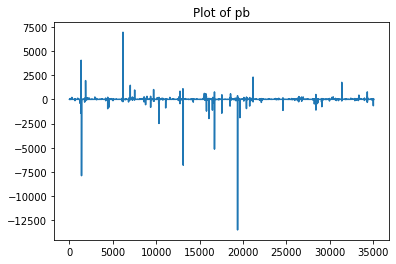

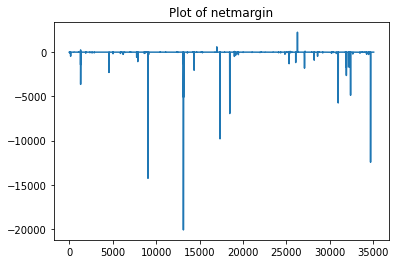

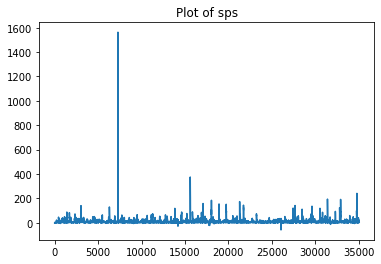

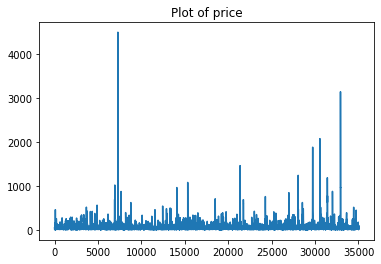

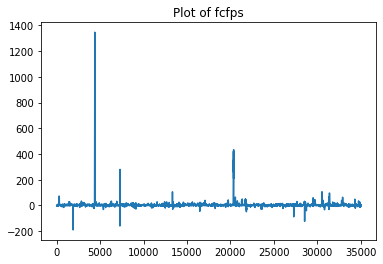

...

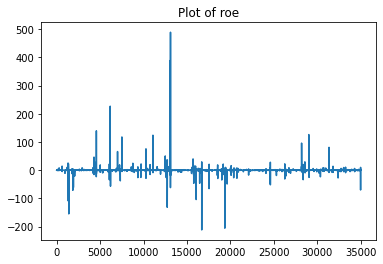

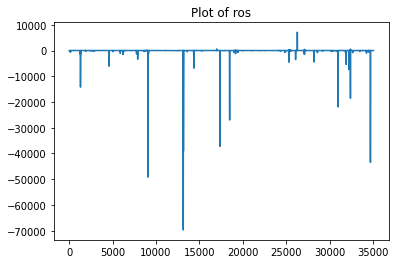

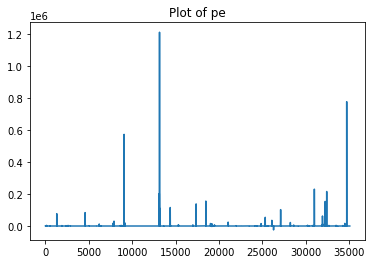

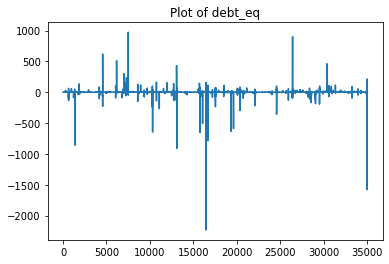

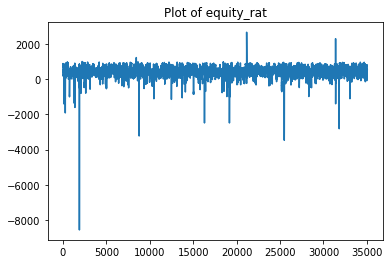

<IPython.core.display.Javascript object>

In [14]:
for col in dfm.columns:
    plt.plot(dfm[col])
    plt.title(f"Plot of {col}")
    plt.show()

In [15]:
# dfp = dfm.sample(100, random_state=55)
# sns.pairplot(dfp, hue="price")
# plt.show()

<IPython.core.display.Javascript object>

## Begin Modeling,
    - Scale Data
        - try PCA / UMAP
    - Cluster with KMeans / DBSCAN
    - Evaluate and Visualize

In [16]:
# Flag to True to drop.
DROP_PRICE = False
DROP_PE = False

if DROP_PRICE:
    dfm = dfm.drop(columns="price", errors="ignore")

if DROP_PRICE:
    dfm = dfm.drop(columns="pe", errors="ignore")

# If I want to run a supervised model on clusters
X = dfm.copy()

<IPython.core.display.Javascript object>

In [17]:
# Scale the df

scaler = StandardScaler()
scaled = scaler.fit_transform(dfm)
scaled = pd.DataFrame(scaled, columns=dfm.columns, index=dfm.index)
scaled.head(2)

,pb,netmargin,sps,price,fcfps,quick,roa,roe,ros,pe,debt_eq,equity_rat
0,0.008101,-0.081110,-0.285589,-0.192542,-0.218118,0.276017,-2.246690,-0.095772,-0.055840,0.054444,-0.021381,1.234688
1,-0.003533,0.025265,-0.280940,-0.263728,-0.216010,0.404370,-1.721764,-0.070138,0.023132,-0.015993,-0.021414,1.418185


<IPython.core.display.Javascript object>

In [18]:
DIM = False
# Flip flag to False to run UMAP on scaled data instead of PCA.

if DIM:
    dim = PCA(3)
    dim_df = dim.fit_transform(scaled)

    variance = dim.explained_variance_ratio_
    var = np.cumsum(np.round(variance, 3) * 100)
    plt.figure(figsize=(12, 6))
    plt.ylabel("% Variance Explained")
    plt.xlabel("# of Features")
    plt.title("PCA Analysis")
    plt.ylim(0, 100.5)
    plt.plot(var)
    print(dim.explained_variance_ratio_)
    print(
        "Total explained variance:",
        dim.explained_variance_ratio_.sum().round(4) * 100,
        "%",
    )

else:
    dim = umap.UMAP(
        n_components=2, n_neighbors=12, min_dist=0.012, metric="correlation"
    ).fit_transform(scaled)

<IPython.core.display.Javascript object>

In [19]:
if DIM:
    dim_df = pd.DataFrame(
        dim_df, columns=['pc' + str(i) for i in range(dim_df.shape[1])], index=dfm.index
    )

else:
    dim_df = pd.DataFrame(
        dim,
        columns=['u' + str(i) for i in range(dim.shape[1])],
        index=dfm.index,
    )


dim_df["ticker"] = dfs["ticker"]
display(dim_df.head(2))



,u0,u1,ticker
0,12.464565,17.702068,ZYME
1,13.311219,17.146553,ZYME


<IPython.core.display.Javascript object>

### Plot Dimension Reduction Method,

In [20]:
if DIM:
    # fig = px.scatter(dim_df, x="pc0", y="pc1", hover_data=["ticker"])
    Scene = dict(
        xaxis=dict(title="pc0"), yaxis=dict(title="pc1"), zaxis=dict(title="pc2")
    )
    trace = go.Scatter3d(
        x=dim_df.iloc[:, 0],
        y=dim_df.iloc[:, 1],
        z=dim_df.iloc[:, 2],
        mode="markers",
        marker=dict(
            colorscale="Greys",
            opacity=0.3,
            size=10,
        ),
    )
    layout = go.Layout(margin=dict(l=0, r=0), scene=Scene, height=1000, width=1000)
    data = [trace]
    fig = go.Figure(data=data, layout=layout)

else:
    fig = px.scatter(
        dim_df,
        x="u0",
        y="u1",
        hover_data=["ticker"],
        title="UMAP Results in Two Dimensions",
    )

fig.show()

<IPython.core.display.Javascript object>

In [21]:
if DIM:
    dim_df = dim_df.drop(columns=["ticker", "label"], errors="ignore")
    dfm = dfm.drop(columns="label", errors="ignore")
    vis_dim = dim.components_.T
    vis_dim = pd.DataFrame(vis_dim, columns=dim_df.columns, index=dfm.columns)
    display(vis_dim.style.background_gradient(axis=1))

else:
    print("Using UMAP, This cell is to better visualize PCA.")

Using UMAP, This cell is to better visualize PCA.


<IPython.core.display.Javascript object>

### Start Clustering 
    - KMeans
    - DBSCAN

In [22]:
# CLST = True, then run KMeans. False = run DBSCAN
CLST = False

# Drop 'ticker' feature for the clustering process.
dim_df = dim_df.drop(columns=["ticker", "calendardate"], errors="ignore")

if CLST:
    for k in range(5, 30, 5):
        pred = KMeans(n_clusters=k, random_state=55).fit_predict(scaled)
        print(
            "Silhouette score for {} cluster k-means: {}".format(
                k, metrics.silhouette_score(scaled, pred, metric="euclidean")
            )
        )
else:
    preds = []
    for k in range(20, 200, 80):
        pred = DBSCAN(eps=0.615, min_samples=k, metric="euclidean").fit_predict(scaled)
        preds.append(metrics.silhouette_score(scaled, pred, metric="euclidean"))
        print(
            "Silhouette score for {} min samples in DBSCAN: {}".format(
                k, metrics.silhouette_score(scaled, pred, metric="euclidean")
            )
        )



Silhouette score for 20 min samples in DBSCAN: 0.4036736459558269
Silhouette score for 100 min samples in DBSCAN: 0.3420964300807505
Silhouette score for 180 min samples in DBSCAN: 0.32729319462989803


<IPython.core.display.Javascript object>

#### Using a higher min sample to give better cluster distribution.  Silhoutte score did not deprecate much in the sample magnitude change, so tuning towards interpretability.
    - KMeans does not do a great job of clustering in comparison, hence why it is flagged. 

In [23]:
# Cluster and display labels and distribution per label
if CLST:
    clst = KMeans(n_clusters=2, random_state=55)
    clst.fit(dim_df)
    print("****Clustered with KMeans****")

else:
    clst = DBSCAN(eps=0.615, min_samples=180, metric="euclidean")
    clst.fit(dim_df)
    print("****Clustered with DBSCAN****")

    # Show the clustering results in a clean way.
labels = pd.Series(clst.labels_)
label_counts = pd.concat(
    (labels.value_counts(normalize=True), labels.value_counts()), axis=1
)
label_counts.columns = ["% of Records", "# of Records"]
label_counts.index.name = "Cluster"
label_counts.sort_values(by="% of Records", ascending=False)

****Clustered with DBSCAN****


,% of Records,# of Records
Cluster,,
3,0.193116,4853
1,0.173776,4367
-1,0.155511,3908
0,0.089813,2257
7,0.045324,1139
6,0.044847,1127
2,0.039355,989
5,0.037286,937
9,0.037087,932


<IPython.core.display.Javascript object>

### Visualize Cluster Results
    - Scatter View   

In [24]:
dim_df = dim_df.drop(columns="label", errors="ignore")

<IPython.core.display.Javascript object>

In [25]:
labeled_df = dfs.copy()
labeled_df["label"] = clst.labels_

plot_df = pd.concat((dim_df, labeled_df), axis=1)
plot_df["label"] = plot_df["label"].astype(str)
plot_df["ticker"] = dfs["ticker"]
# plot_df = plot_df.reset_index()


if DIM:
    fig = px.scatter(
        plot_df,
        x="pc0",
        y="pc1",
        color="label",
        hover_data=["ticker", "pb"],
        title="Graph of Stock Clusters (PCA)",
        opacity=0.3,
    )

else:
    no_outliers = plot_df[plot_df["label"] != "-1"]
    fig = px.scatter(
        no_outliers,
        x="u0",
        y="u1",
        color="label",
        hover_data=["ticker", "pb"],
        title="Graph of Stock Clusters (DBSCAN)",
    )

fig.show()

<IPython.core.display.Javascript object>

### Evaluate the clusters further, 

In [26]:
# List of Stocks to animate to show how they move around cluster.

stocks = [
    "T",
    "ADBE",
    "CSTM",
    "BA",
    "WFC",
    "GOOGL",
    "MSFT",
    "CRM",
    "COKE",
    "FB",
    "MSFT",
    "AAPL",
    "NFLX",
    "DNKN",
    "TSLA",
    "PEP",
    "WYNN",
    "CRM",
    "BAC",
    "PG",
    "WMT",
    "JNJ",
    "JPM",
    "V",
]

<IPython.core.display.Javascript object>

In [27]:
dim_df["label"] = clst.labels_
dim_df["label"] = dim_df["label"].astype(str)
dim_df["ticker"] = dfs["ticker"]
dim_df["calendardate"] = dfs["calendardate"]

dim_df["stock_interest"] = dfs["ticker"].isin(stocks)
dim_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 25130 entries, 0 to 35052
Data columns (total 6 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   u0              25130 non-null  float32
 1   u1              25130 non-null  float32
 2   label           25130 non-null  object 
 3   ticker          25130 non-null  object 
 4   calendardate    25130 non-null  object 
 5   stock_interest  25130 non-null  bool   
dtypes: bool(1), float32(2), object(3)
memory usage: 1006.2+ KB


<IPython.core.display.Javascript object>

In [28]:
dim_df = dim_df.sort_values(by='calendardate', ascending = True)
stock_animation = dim_df[dim_df["stock_interest"] == 1]


fig = px.scatter(
   stock_animation,
    x="u0",
    y="u1",
    text="ticker",
    color="label",
    animation_group="ticker",
    animation_frame="calendardate",
    title = 'Stock Animation To Visualize How Stocks May Change Clusters',
    
)

# Add Trace of Clusters underneath animation.
fig.add_scatter(
    x=dim_df["u0"],
    y=dim_df["u1"],
    mode  = 'markers',
    hoverinfo = 'text',
    hovertextsrc = 'hover',
    hovertext = dim_df['ticker'],
    opacity = .3,
)



# change speed in animation frame change
fig.layout.updatemenus[0].buttons[0].args[1]["frame"]["duration"] = 1500
# change speed in animation transition change
fig.layout.updatemenus[0].buttons[0].args[1]['transition']['duration'] = 1500



<IPython.core.display.Javascript object>

#### A visualization of notable stocks moving around clusters in time,

In [29]:
fig.show()

<IPython.core.display.Javascript object>

### Visualize Stock Animations Prices Over Time for Intuition of Cluster Map Shifts,

In [30]:
df_stocks = df.loc[:, ("ticker", "price", "pb", "calendardate")]
df_stocks["in_list"] = df["ticker"].isin(stocks)
df_stocks = df_stocks[df_stocks["in_list"] == 1]
df_stocks["calendardate"] = pd.to_datetime(df_stocks["calendardate"])
df_stocks = df_stocks.sort_values(by=["ticker", "calendardate"])

melted = pd.melt(df_stocks, id_vars=["price", "calendardate"], value_vars="ticker")
melted

px.line(
    melted,
    x="calendardate",
    y="price",
    color="value",
    title="Stock Prices Over Time ($)",
)

<IPython.core.display.Javascript object>

### Visualize Clusters by Gradient View >> Then Evaluate Per Cluster,
    - Run TTests to see Statistically relevant Features per cluster.
        - Use main_features()
    - Look at top 5 and bottom 5 stocks by feature.
    - See the stability of Stocks staying in clusters
    

In [31]:
# Look at dfm with labels
labeled_df = dfs.copy()
labeled_df["label"] = clst.labels_

# Change var to sort by different feature.
var = "pb"

clst_avgs = labeled_df.groupby("label", as_index=False).median()
clst_avgs["%_of_Records"] = label_counts["% of Records"]
clst_avgs = clst_avgs[clst_avgs["label"] != -1]
clst_avgs = clst_avgs[clst_avgs["%_of_Records"] > 0.03]
clst_avgs = clst_avgs.sort_values(by=var)

# Using .head to look at biggest clusters for easier interpretabiliy.
# remove .head for more precision and to understand outlier/smaller clsts.
print("Cluster Avgs by Original DF, and Over 3% Representation of Indices:")
display(clst_avgs.style.background_gradient())

scaled_df = scaled.copy()
scaled_df["label"] = clst.labels_
# scaled_df = scaled_df[scaled_df["label"] != -1]

sclst = scaled_df.groupby("label", as_index=False).median().sort_values(by=var)
sclst["%_of_Records"] = label_counts["% of Records"]
sclst = sclst[sclst["label"] != -1]
sclst = sclst[sclst["%_of_Records"] > 0.03]
print("\n", "Clusters by Scaled DF, and Over 3% Representation of Indices:")
sclst.style.background_gradient()

Cluster Avgs by Original DF, and Over 3% Representation of Indices:


,label,revenue,pb,debt,assets,netmargin,ncfo,shareswa,sps,opinc,assetsc,liabilitiesc,price,sharesbas,equity,receivables,investmentsc,cashneq,assetsavg,netinccmn,fcfps,quick,roa,roe,ros,pe,debt_eq,equity_rat,%_of_Records
6,5,6.025622,-14.123000,20.015963,24.210482,0.081000,112376000.000000,120077000.000000,6.026000,0.969887,7.967149,6.528971,49.350000,121527514.000000,-3.368900,1.750717,0.000000,2.081410,23.404497,2.154575,2.737000,0.791879,95.140648,-0.570384,0.334498,8.373496,-5.146461,-149.548957,0.044847
7,6,4.245092,2.833000,6.961983,25.174078,0.087000,74293000.000000,118204246.000000,4.237000,0.574838,8.266868,4.182568,33.400000,118334468.000000,11.828057,2.527723,0.000000,1.872597,24.433274,1.735067,1.586000,1.285851,71.631923,0.154027,0.374781,7.097756,0.624429,456.618957,0.045324
4,3,5.206061,3.599000,2.362595,26.275823,0.108000,51838000.000000,62858000.000000,5.172000,0.721374,10.808918,3.956650,63.350000,63155792.000000,17.345926,2.758016,0.000000,3.001370,25.127075,2.145344,2.434000,2.094930,83.328190,0.127721,0.420453,12.962465,0.159936,656.170625,0.036092
9,8,1.263657,3.913500,0.166098,9.712559,-0.139500,2705500.000000,77096000.000000,1.328500,-0.159502,5.504280,1.342178,37.850000,79649251.000000,7.435892,0.708918,0.747714,2.245291,8.563103,-0.704983,-0.098500,3.615019,-78.217232,-0.099230,-0.651695,32.016814,0.025089,761.007952,0.037087
2,1,6.143226,4.249000,21.601168,47.201671,0.062000,132115000.000000,144400000.000000,6.152000,0.787910,9.899149,8.168590,40.740000,149808388.000000,8.618683,3.143505,0.000000,2.042702,45.814138,1.659794,2.088000,0.895219,34.442170,0.157124,0.241583,6.227760,2.288590,205.345342,0.039355
1,0,0.771204,5.230000,1.396972,8.433711,-0.555000,-8834000.000000,65484000.000000,0.782000,-0.374558,5.717488,1.418425,22.030000,66198311.000000,4.099639,0.425165,0.900241,1.929662,7.728672,-1.948094,-0.760000,3.011765,-238.668801,-0.516154,-2.521683,32.720831,0.443139,456.969067,0.173776
3,2,9.602700,5.439000,13.479151,55.274954,0.137000,193552000.000000,104500000.000000,9.631000,1.741214,18.158818,10.563869,134.580000,104543895.000000,25.815154,5.495168,0.000000,4.781859,53.294819,5.516762,5.763000,1.300780,104.454874,0.214095,0.560141,14.887981,0.596748,458.217822,0.193116
5,4,7.340490,6.614000,17.651927,43.143569,0.146000,299715000.000000,165011712.000000,7.340000,1.339614,14.677060,9.362584,100.890000,165259198.000000,14.340658,4.110112,0.000000,3.439629,42.024891,4.088785,4.419000,0.955364,101.469417,0.307894,0.568287,13.929354,1.059302,333.384007,0.037286



 Clusters by Scaled DF, and Over 3% Representation of Indices:


,label,pb,netmargin,sps,price,fcfps,quick,roa,roe,ros,pe,debt_eq,equity_rat,%_of_Records
6,5,-0.132797,0.039417,-0.140173,-0.173780,-0.028036,-0.131274,0.466974,-0.108712,0.039925,-0.029147,-0.211020,-1.885203,0.044847
7,6,-0.007315,0.039443,-0.183720,-0.281813,-0.067167,-0.082396,0.331537,0.019120,0.039973,-0.029267,0.000880,0.202687,0.045324
4,3,-0.001646,0.039535,-0.160961,-0.078955,-0.038337,-0.002338,0.398921,0.014478,0.040026,-0.028716,-0.016175,0.890025,0.036092
9,8,0.000682,0.038452,-0.254517,-0.251672,-0.124437,0.148074,-0.531763,-0.025571,0.038769,-0.026924,-0.021127,1.251127,0.037087
2,1,0.003164,0.039334,-0.137106,-0.232097,-0.050101,-0.121049,0.117282,0.019666,0.039816,-0.029349,0.061986,-0.662802,0.039355
1,0,0.010424,0.036633,-0.267820,-0.358824,-0.146926,0.088382,-1.456146,-0.099142,0.036575,-0.026857,-0.005777,0.203893,0.173776
3,2,0.011971,0.039662,-0.052422,0.403502,0.074841,-0.080919,0.520634,0.029720,0.040190,-0.028535,-0.000136,0.208195,0.193116
5,4,0.020667,0.039701,-0.108189,0.175312,0.029148,-0.115098,0.503435,0.046272,0.040200,-0.028625,0.016848,-0.221784,0.037286


<IPython.core.display.Javascript object>

#### The Largest Clusters in the Group are : 7, 10, 1, 6, 0, 3, 6
    - The Next cell will showcase the most statistically relevant features per Cluster.
    - Then You will see the ticker symbols, stability over time, and top and bottom stocks by signaled feature per cluster. 

In [32]:
# Type in Cluster # to see which features are statistically significant.
### Need to debug before production.
for nclust in list([7, 10, 1, 6, 0, 3, 6]):
    print(main_features(nclust), "\n-----------------------------\n")

Reviewing cluster number: 7 
 
Features that are statistically significant;

netmargin
sps
price
fcfps
quick
roa
ros
pe
equity_rat
None 
-----------------------------

Reviewing cluster number: 10 
 
Features that are statistically significant;

netmargin
sps
price
fcfps
quick
roa
ros
pe
debt_eq
equity_rat
None 
-----------------------------

Reviewing cluster number: 1 
 
Features that are statistically significant;

pb
netmargin
sps
price
fcfps
quick
roa
roe
ros
pe
debt_eq
equity_rat
None 
-----------------------------

Reviewing cluster number: 6 
 
Features that are statistically significant;

netmargin
sps
price
fcfps
quick
roa
roe
ros
pe
equity_rat
None 
-----------------------------

Reviewing cluster number: 0 
 
Features that are statistically significant;

pb
sps
price
fcfps
quick
roa
roe
equity_rat
None 
-----------------------------

Reviewing cluster number: 3 
 
Features that are statistically significant;

netmargin
sps
price
fcfps
quick
roa
roe
ros
pe
debt_eq
equity_rat

<IPython.core.display.Javascript object>

In [33]:
# To see other clusters use - fyi_cluster(cluster_num, feat)
for nclust in list([7, 10, 1, 6, 0, 3, 6]):
    print(
        fyi_cluster(nclust, "equity_rat"),
        "\n----------------\n",
        f"Now Presenting Cluster #:{nclust}",
    )

These are the stock symbols for the cluster:


array(['ZNGA', 'YELP', 'XRAY', 'XPER', 'XOM', 'XNCR', 'XEC', 'WY', 'WPX',
       'WGO', 'WERN', 'WCN', 'WAB', 'VSH', 'VSAT', 'VICR', 'VG', 'UVV',
       'USM', 'USAC', 'UPWK', 'UAA', 'TRUP', 'TRS', 'TRMB', 'TRIP',
       'TRHC', 'THRM', 'TER', 'TEAM', 'SYNA', 'SWBI', 'STAA', 'SSTK',
       'SPSC', 'SNDR', 'SMTC', 'SMPL', 'SMCI', 'SLB', 'SHO', 'SFIX',
       'SATS', 'SAIL', 'RYN', 'RVLV', 'RTLR', 'RRC', 'RP', 'ROKU', 'ROCK',
       'RNG', 'RMBS', 'RIG', 'REGI', 'RAMP', 'QRVO', 'QGEN', 'PWR', 'PTC',
       'PRGS', 'PRGO', 'PRFT', 'PRDO', 'PING', 'PGNY', 'PETQ', 'PEGA',
       'PE', 'PDCE', 'PCRX', 'PCH', 'PAAS', 'OXY', 'OVV', 'OTEX', 'OSPN',
       'OSIS', 'OPK', 'ONTO', 'OMCL', 'OLLI', 'NWSA', 'NVT', 'NVST',
       'NUVA', 'NUE', 'NTCT', 'NOV', 'NFH', 'NEO', 'NEM', 'NBL', 'MXL',
       'MUR', 'MTSI', 'MTLS', 'MTDR', 'MRVL', 'MRO', 'MPLX', 'MOS',
       'MMSI', 'MESO', 'MEI', 'MEDP', 'MD', 'LSCC', 'LRN', 'LPX', 'LNTH',
       'LMNX', 'LM', 'LIVN', 'LITE', 'KTOS', 'KRNT', 'KNX', 'KN', 'KM


 Each Ticker that has less than 19 has moved clusters from here:


HL      19
AGR     18
NTCT    18
ENBL    17
FRPT    15
MOS     15
PE      15
MMSI    15
USM     15
CVLT    14
Name: ticker, dtype: int64


 Top 5 and Bottom 5 by equity_rat:


,21158,21156,22405,14335,24947
ticker,GSHD,GSHD,FRPT,MRVL,EGHT
revenue,1.18629,1.62782,0.937873,1.16844,0.655444
pb,14.813,13.176,2.382,1.444,3.232
debt,3.61295,3.37774,0,0,0
assets,2.3054,3.40595,3.40757,9.22604,3.58346
netmargin,0.015,0.107,-0.056,0.086,-0.019
ncfo,66000,1.802e+06,2.01519e+06,5.9282e+07,8.183e+06
shareswa,1.3533e+07,1.4211e+07,3.35373e+07,5.11235e+08,8.7472e+07
sps,1.186,1.628,0.938,1.168,0.655
opinc,0.196039,0.611357,-0.0476841,0.0985046,-0.0339652



 Bottom 5 stocks by equity_rat in cluster:


,32257,32256,20646,32253,20645
ticker,ASH,ASH,HES,ASH,HES
revenue,10.708,10.6846,5.00826,10.2213,5.61282
pb,1.435,1.537,2.067,1.559,2.331
debt,40.5878,40.5118,24.5091,41.5708,26.2042
assets,131.83,132.3,71.5074,126.371,71.959
netmargin,0.054,0.015,-0.14,0.103,-0.131
ncfo,1.19e+08,2.02e+08,4.43e+08,1.28e+08,2.86e+08
shareswa,6.23832e+07,6.24262e+07,3.025e+08,6.27122e+07,3.027e+08
sps,10.708,10.685,5.008,10.221,5.613
opinc,0.480898,0.0320378,0.132231,0.637834,0.102412


None 
----------------
 Now Presenting Cluster #:7
These are the stock symbols for the cluster:


array(['XEL', 'WYNN', 'WEX', 'WEC', 'WAB', 'TMUS', 'SWX', 'SRE', 'SR',
       'SQ', 'SO', 'SKYW', 'SJW', 'SHAK', 'RUN', 'RCL', 'PYPL', 'PNW',
       'PCTY', 'PCG', 'OGS', 'NWN', 'NFLX', 'LNG', 'LLY', 'GPN', 'FMC',
       'FLEX', 'FIS', 'EXPE', 'ETR', 'ES', 'EL', 'EIX', 'EFX', 'EE', 'ED',
       'DUK', 'DTE', 'DD', 'D', 'CPK', 'CME', 'CHTR', 'CDAY', 'CCI',
       'BKH', 'BILL', 'BA', 'AWK', 'ATO', 'ASH', 'AMT', 'ALV', 'ALGT',
       'ALB', 'AEP', 'AEE'], dtype=object)


 Each Ticker that has less than 19 has moved clusters from here:


ED     19
AMT    19
DUK    19
AWK    19
PNW    19
D      19
DTE    19
CPK    18
SWX    18
AEP    17
Name: ticker, dtype: int64


 Top 5 and Bottom 5 by equity_rat:


,26067,12012,12008,12000,27378
ticker,DD,OGS,OGS,OGS,CPK
revenue,29.1941,10.4688,12.1372,9.96412,7.04821
pb,0.823,1.818,1.709,2.016,2.135
debt,70.1636,24.3086,28.0602,33.2199,20.1726
assets,377.479,93.0058,98.0742,107.06,74.192
netmargin,0.033,0.139,0.142,0.174,0.041
ncfo,-2.421e+09,1.62236e+08,2.23284e+08,1.82733e+08,8.07e+06
shareswa,5.25928e+08,5.2576e+07,5.2604e+07,5.3007e+07,1.53724e+07
sps,29.194,10.469,12.137,9.964,7.048
opinc,2.38816,2.76155,2.78477,2.82372,0.660664



 Bottom 5 stocks by equity_rat in cluster:


,31361,16483,16482,31360,31359
ticker,BA,LNG,LNG,BA,BA
revenue,29.8781,0.775296,2.03145,20.8457,24.9541
pb,-8.683,-5.918,-6.412,-8.866,-7.891
debt,68.7878,85.2674,90.935,108.367,107.587
assets,252.827,93.8977,99.1222,287.556,284.612
netmargin,-0.037,-1.684,-0.217,-0.201,-0.032
ncfo,-4.302e+09,-1.64e+08,-2.4e+07,-5.28e+09,-4.819e+09
shareswa,5.659e+08,2.283e+08,2.289e+08,5.664e+08,5.666e+08
sps,29.878,0.775,2.031,20.846,24.954
opinc,-2.48631,-0.332895,0.0655308,-5.30014,-0.898341


None 
----------------
 Now Presenting Cluster #:10
These are the stock symbols for the cluster:


array(['ZTS', 'ZBRA', 'YUM', 'YETI', 'XYL', 'XRX', 'XEL', 'X', 'WYNN',
       'WYND', 'WWW', 'WWE', 'WTRG', 'WSM', 'WSC', 'WMS', 'WMB', 'WM',
       'WLK', 'WHD', 'WH', 'WES', 'WEN', 'WEC', 'WAT', 'WAB', 'W', 'VZ',
       'VST', 'VSLR', 'VRT', 'VRSK', 'VRRM', 'VMW', 'VIAC', 'VFC', 'VC',
       'URI', 'UPS', 'UNVR', 'UGI', 'UAL', 'TWNK', 'TU', 'TTWO', 'TTEC',
       'TTD', 'TT', 'TSLA', 'TRU', 'TRP', 'TROX', 'TREX', 'TPX', 'TNET',
       'TNC', 'TMUS', 'TJX', 'TGNA', 'TEX', 'TEVA', 'TERP', 'TDC', 'TCP',
       'T', 'SYY', 'SYNH', 'SWX', 'SWN', 'SWM', 'SWCH', 'SUM', 'STX',
       'ST', 'SSNC', 'SRE', 'SQ', 'SPXC', 'SPR', 'SPGI', 'SPB', 'SON',
       'SO', 'SNBR', 'SMG', 'SLGN', 'SKYW', 'SJW', 'SJI', 'SITE', 'SIRI',
       'SHLX', 'SHEN', 'SHAK', 'SFM', 'SEM', 'SEE', 'SEAS', 'SCI', 'SBUX',
       'SBGI', 'SAVE', 'SAIC', 'SABR', 'RXN', 'RTX', 'RTLR', 'RRR', 'RPM',
       'RPAY', 'ROST', 'ROK', 'RL', 'RH', 'RCM', 'QSR', 'QRTEA', 'QDEL',
       'QCOM', 'PZZA', 'PYPL', 'PTC', 'PSXP', 'PRPL', 


 Each Ticker that has less than 19 has moved clusters from here:


TGNA    19
BLKB    19
WES     19
HBI     19
BYD     19
ICE     19
OMC     19
VZ      19
BGS     19
NCR     19
Name: ticker, dtype: int64


 Top 5 and Bottom 5 by equity_rat:


,23832,4306,22729,18687,21730
ticker,EVRG,TNC,FLS,IQV,GILD
revenue,4.81369,11.6639,7.54992,10.2564,4.3179
pb,1.569,3.226,4.003,2.507,4.378
debt,37.7694,20.0085,12.5642,36.2668,21.0779
assets,103.088,56.0413,36.7643,92.06,49.6181
netmargin,0.082,0.067,0.059,0.042,0.375
ncfo,3.621e+08,3.98e+07,1.0831e+07,5.6e+07,2.212e+09
shareswa,2.528e+08,1.83472e+07,1.31138e+08,2.301e+08,1.296e+09
sps,4.814,11.664,7.55,10.256,4.318
opinc,0.829114,1.24815,0.747439,0.877879,2.02392



 Bottom 5 stocks by equity_rat in cluster:


,14197,1849,18871,18872,18873
ticker,MSGS,W,INVA,INVA,INVA
revenue,2.37046,40.2585,0.61108,0.665054,0.520655
pb,-14.871,-19.019,-13.892,-8.899,-7.948
debt,44.5045,39.108,3.77469,4.82316,4.81682
assets,50.676,47.7959,2.75118,3.35761,2.75083
netmargin,-0.498,0.045,0.763,0.814,0.565
ncfo,-5.7485e+07,3.31027e+08,6.0115e+07,5.1725e+07,4.9914e+07
shareswa,2.4062e+07,9.5373e+07,1.00936e+08,1.00873e+08,1.00604e+08
sps,2.37,40.258,0.611,0.665,0.521
opinc,-1.13889,2.32617,0.571263,0.621326,0.404507


None 
----------------
 Now Presenting Cluster #:1
These are the stock symbols for the cluster:


array(['ZGNX', 'YUMC', 'XYL', 'XPER', 'XEC', 'WY', 'WWW', 'WWE', 'WWD',
       'WTS', 'WPX', 'WOR', 'WLK', 'WHD', 'WGO', 'WERN', 'VSH', 'VRNT',
       'VFC', 'URBN', 'UAA', 'TXRH', 'TTMI', 'TTEK', 'TTEC', 'TRS',
       'TRMB', 'TRI', 'TRGP', 'TREX', 'TPR', 'TKR', 'THRM', 'TDS', 'TAP',
       'SYNH', 'SWN', 'SWM', 'SWI', 'SWBI', 'SUPN', 'STNE', 'STLD',
       'SSNC', 'SRCL', 'SONO', 'SNDR', 'SKY', 'SKX', 'SJW', 'SHLX',
       'SHEN', 'SFM', 'SCS', 'SCCO', 'SAVE', 'SATS', 'RYN', 'RVLV',
       'RTLR', 'RPAY', 'ROL', 'ROCK', 'REGI', 'RBA', 'QRTEA', 'QGEN',
       'PYPL', 'PSXP', 'PSN', 'PRMW', 'PRGS', 'PRDO', 'PPC', 'PNR', 'PKI',
       'PFE', 'PEGA', 'PDCO', 'PCH', 'PAA', 'OXY', 'OVV', 'OTEX', 'ORCL',
       'ORA', 'ON', 'OMCL', 'NYT', 'NWL', 'NUVA', 'NUS', 'NOVT', 'NLOK',
       'NBL', 'MXL', 'MXIM', 'MWA', 'MUR', 'MU', 'MTX', 'MTSI', 'MTDR',
       'MSFT', 'MSA', 'MRK', 'MPLX', 'MLI', 'MLHR', 'MGEE', 'MEI', 'MDRX',
       'MDLZ', 'MCHP', 'MBUU', 'MASI', 'LZB', 'LSCC', 'LPX', 'LOGM',
  


 Each Ticker that has less than 19 has moved clusters from here:


ORA     19
SCCO    19
CENT    18
DCI     17
CBZ     17
BRO     17
MLHR    16
ENTG    16
FLWS    15
AMAT    13
Name: ticker, dtype: int64


 Top 5 and Bottom 5 by equity_rat:


,9890,29989,170,27492,30968
ticker,PRDO,BSM,ZGNX,CORT,BEAT
revenue,2.91814,0.211588,0.372381,0.212778,1.88793
pb,0.906,1.778,1.317,19.481,5.476
debt,0,0.711066,0.839617,0.131034,1.33136
assets,8.0733,6.09492,11.5932,0.61436,5.87894
netmargin,0.015,0.543,-1.129,0.193,0.079
ncfo,-1.0192e+07,6.3445e+07,-2.1416e+07,4.569e+06,-4.3931e+07
shareswa,6.8155e+07,2.06732e+08,2.4722e+07,1.1191e+08,2.81022e+07
sps,2.918,0.212,0.372,0.213,1.888
opinc,0.102399,0.122032,-0.516948,0.0447413,0.176712



 Bottom 5 stocks by equity_rat in cluster:


,7595,7596,13829,9746,4092
ticker,SAVE,SAVE,MWA,PRMW,TRGP
revenue,12.48,10.3226,1.24114,4.34584,13.185
pb,1.431,1.498,4.302,1.608,2.089
debt,27.5108,27.1386,2.99441,9.73462,26.3528
assets,68.596,68.2338,7.51647,23.0311,73.1528
netmargin,0.013,-0.064,0.367,0.001,-0.018
ncfo,7.9853e+07,1.71135e+08,-5.24e+07,9.42e+07,3.709e+08
shareswa,6.82507e+07,6.8213e+07,1.609e+08,1.37879e+08,2.265e+08
sps,12.48,10.323,1.241,4.346,13.185
opinc,1.59004,-0.568762,0.07023,0.0304615,0.338631


None 
----------------
 Now Presenting Cluster #:6
These are the stock symbols for the cluster:


array(['ZYME', 'ZUO', 'ZS', 'ZIOP', 'ZGNX', 'ZG', 'ZEN', 'YEXT', 'XPER',
       'XLRN', 'XEC', 'X', 'WTS', 'WSC', 'WRK', 'WPX', 'WORK', 'WMS',
       'WMGI', 'WKHS', 'WK', 'WDC', 'WDAY', 'W', 'VXRT', 'VRTX', 'VRNS',
       'VNOM', 'VNE', 'VIR', 'VIE', 'VCYT', 'VBIV', 'VAPO', 'USAC',
       'URGN', 'UBER', 'UAA', 'TXG', 'TWTR', 'TWST', 'TWOU', 'TSLA',
       'TRIP', 'TRHC', 'TRGP', 'TPTX', 'TPR', 'TNDM', 'TLND', 'THS',
       'TEX', 'TEVA', 'TENB', 'TEAM', 'TDOC', 'TDC', 'TCP', 'TBPH',
       'TBIO', 'SWN', 'SWAV', 'SVMK', 'SUN', 'SRRA', 'SRPT', 'SRNE',
       'SRCL', 'SQ', 'SPWR', 'SPOT', 'SPLK', 'SPCE', 'SONO', 'SNDX',
       'SNAP', 'SMAR', 'SLB', 'SITE', 'SILK', 'SGMO', 'SE', 'SDGR', 'SDC',
       'SATS', 'SAGE', 'SABR', 'RVNC', 'RVMD', 'RRC', 'RPD', 'ROKU',
       'RMBS', 'RGNX', 'RETA', 'REAL', 'RDFN', 'RCUS', 'RCM', 'RARE',
       'RAPT', 'QURE', 'QTWO', 'QDEL', 'QCOM', 'PVH', 'PTCT', 'PSTG',
       'PS', 'PRSP', 'PRO', 'PRNB', 'PRGO', 'PODD', 'PLUG', 'PLAN',
       'PINS', 'PHR'


 Each Ticker that has less than 19 has moved clusters from here:


CGIX    19
NVRO    19
ALNY    19
FEYE    19
CERS    19
AGIO    19
GNMK    19
CYRX    19
BLUE    19
PTCT    19
Name: ticker, dtype: int64


 Top 5 and Bottom 5 by equity_rat:


,18478,8648,4179,12215,34243
ticker,ITCI,RGNX,TPTX,NXTC,ADVM
revenue,0.0026426,0.0149276,0.592616,0.813541,0.00376176
pb,1.588,1.363,5.251,3.074,1.466
debt,0,0,0.0982321,0.171702,0
assets,8.05023,8.16591,17.1772,12.4867,4.47854
netmargin,-154.79,-27.399,-0.708,0.435,-79.63
ncfo,-2.48883e+07,-7.887e+06,1.742e+06,-1.0594e+07,-1.2984e+07
shareswa,4.34198e+07,2.6327e+07,4.21858e+07,2.75069e+07,5.742e+07
sps,0.003,0.015,0.593,0.814,0.004
opinc,-0.428802,-0.427356,-0.43946,0.298543,-0.312539



 Bottom 5 stocks by equity_rat in cluster:


,19455,32411,4401,24612,4302
ticker,ICPT,ARNA,TLND,ENPH,TNDM
revenue,2.18048,0.391312,2.15534,1.8758,4.01339
pb,78.678,30.652,50.487,5.392,45.123
debt,16.2263,2.74905,5.07426,0.771077,14.5873
assets,23.0211,8.96195,11.4918,3.73171,29.492
netmargin,-1.373,-2.858,-0.318,-0.211,-2.425
ncfo,-6.0484e+07,-1.6187e+07,-1.5099e+07,-2.0597e+07,-1.8154e+07
shareswa,3.2791e+07,2.4308e+07,3.1428e+07,4.7278e+07,3.063e+06
sps,2.18,0.391,2.155,1.876,4.013
opinc,-2.723,-1.07878,-0.624761,-0.375037,-9.27653


None 
----------------
 Now Presenting Cluster #:0
These are the stock symbols for the cluster:


array(['ZNGA', 'ZM', 'ZBH', 'YUMC', 'YNDX', 'YELP', 'XRAY', 'XNCR',
       'XLNX', 'XEC', 'WWE', 'WWD', 'WTS', 'WST', 'WSM', 'WLK', 'WIRE',
       'WGO', 'WERN', 'WDC', 'WCN', 'WAT', 'WAB', 'VSAT', 'VRTX', 'VNOM',
       'VMW', 'VMC', 'VICR', 'VFC', 'VEEV', 'VAR', 'V', 'UVV', 'UTHR',
       'USPH', 'USNA', 'USM', 'URBN', 'UNF', 'UI', 'UFPI', 'TYL', 'TXRH',
       'TXN', 'TWTR', 'TWLO', 'TTWO', 'TTEK', 'TSCO', 'TRS', 'TRMB',
       'TRIP', 'TRI', 'TRHC', 'TREX', 'TREE', 'TR', 'TPR', 'TNC', 'TMO',
       'TKR', 'TIF', 'THRM', 'TFX', 'TER', 'TEL', 'TECH', 'TDY', 'TDOC',
       'TAP', 'SYNA', 'SYKE', 'SXT', 'SWKS', 'SWBI', 'SUPN', 'STRA',
       'STMP', 'STLD', 'STE', 'STAA', 'SSTK', 'SSD', 'SPSC', 'SPOT',
       'SNPS', 'SNDR', 'SNA', 'SMTC', 'SMPL', 'SMCI', 'SLP', 'SLB',
       'SLAB', 'SKY', 'SKX', 'SHOP', 'SHOO', 'SHO', 'SHLX', 'SGEN',
       'SFIX', 'SEIC', 'SEDG', 'SATS', 'SAM', 'SAIA', 'RYN', 'RVLV',
       'ROST', 'ROP', 'ROLL', 'ROL', 'ROKU', 'ROG', 'ROCK', 'RNG', 'RMD',
       'R


 Each Ticker that has less than 19 has moved clusters from here:


SYKE    19
GNTX    19
ANSS    19
MKSI    19
CTSH    19
MTRN    19
EXPD    19
STMP    19
ADUS    19
ODFL    19
Name: ticker, dtype: int64


 Top 5 and Bottom 5 by equity_rat:


,31402,21155,8449,8450,8448
ticker,AZPN,GSHD,RMAX,RMAX,RMAX
revenue,2.81959,1.30317,2.46102,2.44064,2.58188
pb,4.332,22.697,1.552,1.331,1.671
debt,3.19572,3.19669,10.602,10.655,10.5753
assets,12.5361,2.56063,21.2539,21.2027,22.0069
netmargin,0.528,0.047,0.16,0.115,0.149
ncfo,8.5177e+07,8.88e+06,1.4554e+07,1.2478e+07,2.2008e+07
shareswa,6.8842e+07,1.4876e+07,1.76366e+07,1.75844e+07,1.76457e+07
sps,2.82,1.303,2.461,2.441,2.582
opinc,1.59147,0.260352,1.17375,0.901768,1.19814



 Bottom 5 stocks by equity_rat in cluster:


,28037,14295,23002,22972,33681
ticker,CMP,MSA,FIS,FISV,ALE
revenue,5.01717,7.87514,6.33233,5.17164,5.9031
pb,3.662,4.669,3.109,2.069,1.879
debt,22.2058,10.3883,27.5196,32.6478,31.2752
assets,49.035,36.0175,73.3958,115.064,106.256
netmargin,0.037,0.084,0.028,0.001,0.163
ncfo,5.73e+07,1.03457e+08,5.51e+08,1.031e+09,7.31e+07
shareswa,3.3784e+07,3.75906e+07,3.31e+08,6.7e+08,5.16e+07
sps,5.017,7.875,6.332,5.172,5.903
opinc,0.458797,1.12587,1.16314,0.250746,0.965116


None 
----------------
 Now Presenting Cluster #:3
These are the stock symbols for the cluster:


array(['ZGNX', 'YUMC', 'XYL', 'XPER', 'XEC', 'WY', 'WWW', 'WWE', 'WWD',
       'WTS', 'WPX', 'WOR', 'WLK', 'WHD', 'WGO', 'WERN', 'VSH', 'VRNT',
       'VFC', 'URBN', 'UAA', 'TXRH', 'TTMI', 'TTEK', 'TTEC', 'TRS',
       'TRMB', 'TRI', 'TRGP', 'TREX', 'TPR', 'TKR', 'THRM', 'TDS', 'TAP',
       'SYNH', 'SWN', 'SWM', 'SWI', 'SWBI', 'SUPN', 'STNE', 'STLD',
       'SSNC', 'SRCL', 'SONO', 'SNDR', 'SKY', 'SKX', 'SJW', 'SHLX',
       'SHEN', 'SFM', 'SCS', 'SCCO', 'SAVE', 'SATS', 'RYN', 'RVLV',
       'RTLR', 'RPAY', 'ROL', 'ROCK', 'REGI', 'RBA', 'QRTEA', 'QGEN',
       'PYPL', 'PSXP', 'PSN', 'PRMW', 'PRGS', 'PRDO', 'PPC', 'PNR', 'PKI',
       'PFE', 'PEGA', 'PDCO', 'PCH', 'PAA', 'OXY', 'OVV', 'OTEX', 'ORCL',
       'ORA', 'ON', 'OMCL', 'NYT', 'NWL', 'NUVA', 'NUS', 'NOVT', 'NLOK',
       'NBL', 'MXL', 'MXIM', 'MWA', 'MUR', 'MU', 'MTX', 'MTSI', 'MTDR',
       'MSFT', 'MSA', 'MRK', 'MPLX', 'MLI', 'MLHR', 'MGEE', 'MEI', 'MDRX',
       'MDLZ', 'MCHP', 'MBUU', 'MASI', 'LZB', 'LSCC', 'LPX', 'LOGM',
  


 Each Ticker that has less than 19 has moved clusters from here:


ORA     19
SCCO    19
CENT    18
DCI     17
CBZ     17
BRO     17
MLHR    16
ENTG    16
FLWS    15
AMAT    13
Name: ticker, dtype: int64


 Top 5 and Bottom 5 by equity_rat:


,9890,29989,170,27492,30968
ticker,PRDO,BSM,ZGNX,CORT,BEAT
revenue,2.91814,0.211588,0.372381,0.212778,1.88793
pb,0.906,1.778,1.317,19.481,5.476
debt,0,0.711066,0.839617,0.131034,1.33136
assets,8.0733,6.09492,11.5932,0.61436,5.87894
netmargin,0.015,0.543,-1.129,0.193,0.079
ncfo,-1.0192e+07,6.3445e+07,-2.1416e+07,4.569e+06,-4.3931e+07
shareswa,6.8155e+07,2.06732e+08,2.4722e+07,1.1191e+08,2.81022e+07
sps,2.918,0.212,0.372,0.213,1.888
opinc,0.102399,0.122032,-0.516948,0.0447413,0.176712



 Bottom 5 stocks by equity_rat in cluster:


,7595,7596,13829,9746,4092
ticker,SAVE,SAVE,MWA,PRMW,TRGP
revenue,12.48,10.3226,1.24114,4.34584,13.185
pb,1.431,1.498,4.302,1.608,2.089
debt,27.5108,27.1386,2.99441,9.73462,26.3528
assets,68.596,68.2338,7.51647,23.0311,73.1528
netmargin,0.013,-0.064,0.367,0.001,-0.018
ncfo,7.9853e+07,1.71135e+08,-5.24e+07,9.42e+07,3.709e+08
shareswa,6.82507e+07,6.8213e+07,1.609e+08,1.37879e+08,2.265e+08
sps,12.48,10.323,1.241,4.346,13.185
opinc,1.59004,-0.568762,0.07023,0.0304615,0.338631


None 
----------------
 Now Presenting Cluster #:6


<IPython.core.display.Javascript object>

### Run a Supervised Model,
    - XGBoost to see how well we could predict clusters if we were to add stocks. 

In [34]:
import warnings

warnings.filterwarnings("ignore")

# How likely would we be able to predict which cluster a new stock
# added to the model would fall into?
y = clst.labels_

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

pipeline = Pipeline(
    [
        ("scale", StandardScaler()),
        ("xgb", XGBClassifier(n_estimators=1000, learning_rate=0.001)),
        # ("rf", RandomForestClassifier(max_depth=3)),
    ]
)
pipeline.fit(X_train, y_train)

print(f"Train score: {pipeline.score(X_train, y_train)}")
print(f"Test score: {pipeline.score(X_test, y_test)}")

y_pred = pipeline.predict(X_test)

confusion_mat = confusion_matrix(y_test, y_pred)

[18:14:40] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Train score: 0.8863907680063668
Test score: 0.8505769996020692


<IPython.core.display.Javascript object>

#### To give more interpretability, set the confusion matrix for the clusters over 3% of index,


In [35]:
confusion_mat = pd.DataFrame(
    confusion_mat,
    columns=["Predicted" + str(i) for i in set(y_test)],
    index=["Actual" + str(i) for i in set(y_test)],
)

clusters = 7, 10, 1, 6, 0, 3, 6

clst_confusion_mat = pd.DataFrame(
    confusion_mat,
    columns=["Predicted" + str(i) for i in set(clusters)],
    index=["Actual" + str(i) for i in set(clusters)],
)

# Unhash if you want to see large version.
# confusion_mat
clst_confusion_mat

,Predicted0,Predicted1,Predicted3,Predicted6,Predicted7,Predicted10
Actual0,469,63,19,4,18,6
Actual1,14,430,0,0,0,0
Actual3,1,0,166,0,2,0
Actual6,2,0,0,185,0,0
Actual7,7,0,1,0,190,0
Actual10,11,0,0,0,0,173


<IPython.core.display.Javascript object>

#### The predictiveness seems to be pretty strong in the clusters of interest and fairly aligned to the the train and test scores. I think this is a decent model for a first pass. 

In [36]:
# Check feature importance in the case of tuning further.

feature_importance = pipeline["xgb"].feature_importances_
feature_importance = pd.DataFrame(
    {"feature": X_train.columns, "importance": feature_importance}
)
feature_importance.sort_values(by="importance", ascending=False)

,feature,importance
11,equity_rat,0.179548
6,roa,0.175165
10,debt_eq,0.157859
2,sps,0.104658
7,roe,0.085855
8,ros,0.073470
3,price,0.062399
9,pe,0.048857
0,pb,0.039457
5,quick,0.030457


<IPython.core.display.Javascript object>